In [7]:
import json
import re
import matplotlib.pyplot as plt
from collections import Counter
import random
import numpy as np

In [8]:
train_set = json.load(open('train.json'))
dev_set = json.load(open('dev.json'))
test_set = json.load(open('test.json'))

In [9]:
np.unique([x.split('_')[0] for x in dev_set.keys()], return_counts=True)

(array(['adjusting', 'admiring', 'ailing', 'aiming', 'applauding',
        'applying', 'apprehending', 'arching', 'arranging', 'arresting',
        'ascending', 'asking', 'assembling', 'attaching', 'attacking',
        'autographing', 'baking', 'ballooning', 'bandaging', 'baptizing',
        'barbecuing', 'bathing', 'begging', 'betting', 'biking', 'biting',
        'blocking', 'blossoming', 'boarding', 'boating', 'bothering',
        'bouncing', 'bowing', 'braiding', 'branching', 'brawling',
        'breaking', 'brewing', 'browsing', 'brushing', 'bubbling',
        'buckling', 'building', 'bulldozing', 'burning', 'burying',
        'buttering', 'butting', 'buttoning', 'buying', 'calling',
        'calming', 'camouflaging', 'camping', 'caressing', 'carrying',
        'carting', 'carving', 'catching', 'celebrating', 'chasing',
        'checking', 'cheering', 'cheerleading', 'chewing', 'chiseling',
        'chopping', 'circling', 'clapping', 'clawing', 'cleaning',
        'clearing', 'cle

In [10]:
np.unique([x.split('_')[0] for x in test_set.keys()], return_counts=True)

(array(['adjusting', 'admiring', 'ailing', 'aiming', 'applauding',
        'applying', 'apprehending', 'arching', 'arranging', 'arresting',
        'ascending', 'asking', 'assembling', 'attaching', 'attacking',
        'autographing', 'baking', 'ballooning', 'bandaging', 'baptizing',
        'barbecuing', 'bathing', 'begging', 'betting', 'biking', 'biting',
        'blocking', 'blossoming', 'boarding', 'boating', 'bothering',
        'bouncing', 'bowing', 'braiding', 'branching', 'brawling',
        'breaking', 'brewing', 'browsing', 'brushing', 'bubbling',
        'buckling', 'building', 'bulldozing', 'burning', 'burying',
        'buttering', 'butting', 'buttoning', 'buying', 'calling',
        'calming', 'camouflaging', 'camping', 'caressing', 'carrying',
        'carting', 'carving', 'catching', 'celebrating', 'chasing',
        'checking', 'cheering', 'cheerleading', 'chewing', 'chiseling',
        'chopping', 'circling', 'clapping', 'clawing', 'cleaning',
        'clearing', 'cle

In [61]:
keys, counts = np.unique([x.split('_')[0] for x in train_set.keys()], return_counts=True)
list(zip(keys, counts))

[('adjusting', 208),
 ('admiring', 266),
 ('ailing', 86),
 ('aiming', 160),
 ('applauding', 140),
 ('applying', 258),
 ('apprehending', 95),
 ('arching', 113),
 ('arranging', 206),
 ('arresting', 119),
 ('ascending', 99),
 ('asking', 127),
 ('assembling', 264),
 ('attaching', 216),
 ('attacking', 122),
 ('autographing', 88),
 ('baking', 133),
 ('ballooning', 253),
 ('bandaging', 91),
 ('baptizing', 108),
 ('barbecuing', 155),
 ('bathing', 84),
 ('begging', 106),
 ('betting', 81),
 ('biking', 132),
 ('biting', 241),
 ('blocking', 139),
 ('blossoming', 161),
 ('boarding', 104),
 ('boating', 127),
 ('bothering', 117),
 ('bouncing', 84),
 ('bowing', 98),
 ('braiding', 89),
 ('branching', 183),
 ('brawling', 117),
 ('breaking', 110),
 ('brewing', 86),
 ('browsing', 143),
 ('brushing', 272),
 ('bubbling', 119),
 ('buckling', 65),
 ('building', 148),
 ('bulldozing', 84),
 ('burning', 152),
 ('burying', 89),
 ('buttering', 84),
 ('butting', 132),
 ('buttoning', 85),
 ('buying', 115),
 ('callin

In [12]:
set(train_set.keys()).intersection(set(dev_set.keys())), set(train_set.keys()).intersection(set(test_set.keys()))

(set(), set())

In [13]:
set(dev_set.keys()).intersection(set(test_set.keys()))

set()

In [33]:
from imsitu import imSituSituation
import torchvision as tv
import torch
from torchvision.utils import make_grid
import torchvision.transforms.functional as F

In [46]:
dev_transform = tv.transforms.Compose([
    tv.transforms.Resize(224),
    tv.transforms.CenterCrop(224),
    tv.transforms.ToTensor(),
])

In [47]:
encoder = torch.load('baseline_encoder')

In [48]:
dataset_train = imSituSituation('/scr/biggest/of500_images_resized', train_set, encoder, dev_transform)
dataset_dev = imSituSituation('/scr/biggest/of500_images_resized', dev_set, encoder, dev_transform)
dataset_test = imSituSituation('/scr/biggest/of500_images_resized', test_set, encoder, dev_transform)

In [49]:
train_loader = torch.utils.data.DataLoader(dataset_train, batch_size=64, shuffle=True, num_workers=4)
dev_loader = torch.utils.data.DataLoader(dataset_dev, batch_size=64, shuffle=True, num_workers=4)
test_loader = torch.utils.data.DataLoader(dataset_test, batch_size=64, shuffle=True, num_workers=4)

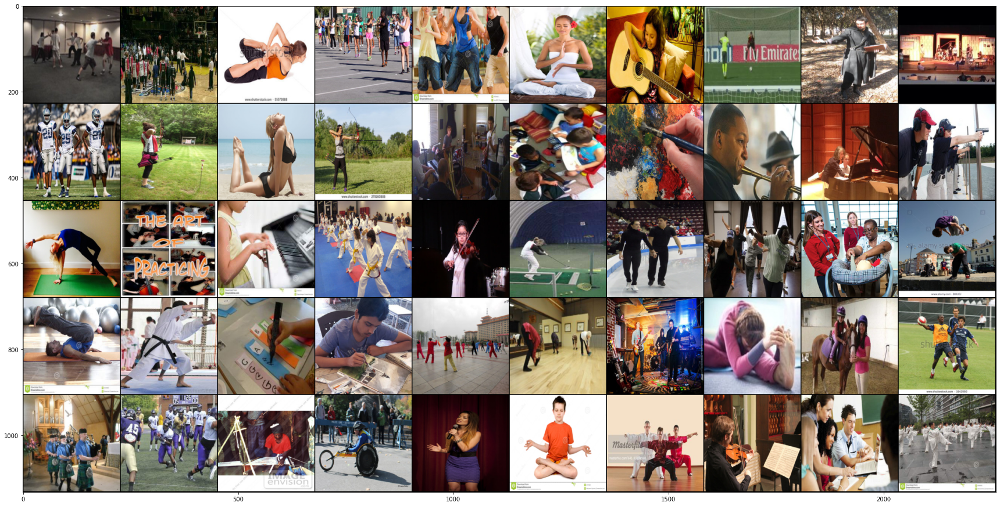

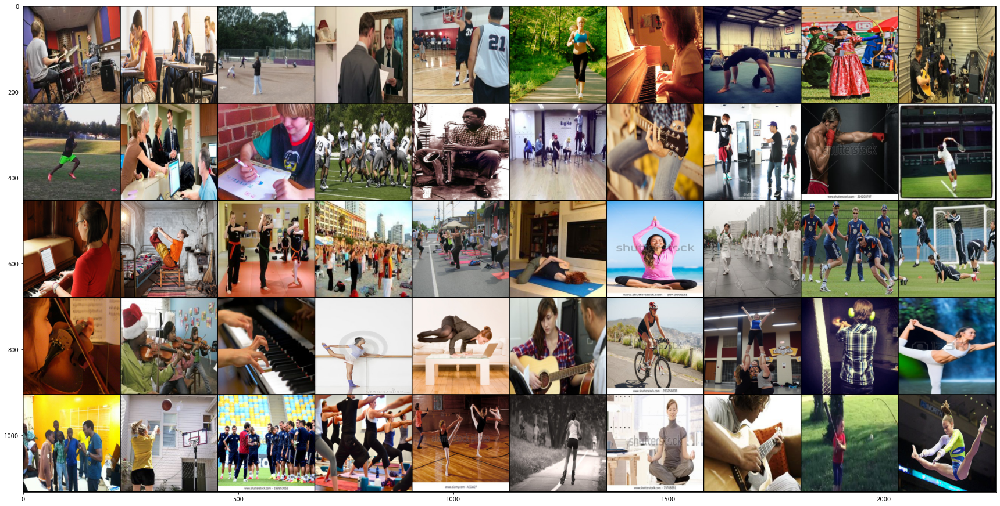

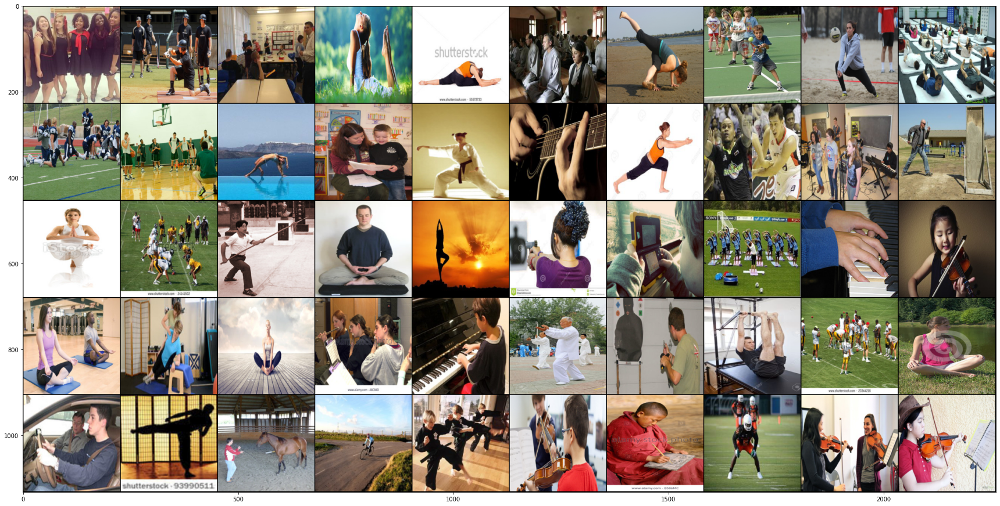

In [82]:
word = 'practicing'
for dataset in [train_set, dev_set, test_set]:
    dataset = {k: v for k, v in dataset.items() if k.split('_')[0] == word}
    dataset = imSituSituation('/scr/biggest/of500_images_resized', dataset, encoder, dev_transform)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=50, shuffle=True, num_workers=4)
    _, images, _ = iter(dataloader).next()
    images = make_grid(images, nrow=10)
    plt.figure(figsize = (30, 30))
    plt.imshow(F.to_pil_image(images))